# Import

In [1]:
# Base
import pandas as pd
import numpy as np 
from tqdm.notebook import tqdm
import torch
import joblib
import matplotlib.pyplot as plt
import numpy
import seaborn as sns


# Pycaret
from pycaret.anomaly import *

# Ellipticenvelope
from sklearn.covariance import EllipticEnvelope

# LGBM
import lightgbm 
from lightgbm import LGBMClassifier

# Isolation
from sklearn.ensemble import IsolationForest

# Preprocessing
from sklearn.preprocessing import LabelEncoder

#Verification
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# Tuning
import optuna
from optuna.samplers import TPESampler

# os
import warnings
warnings.filterwarnings(action='ignore')



# Data Load

In [2]:
train_data = pd.read_csv('../Data/test_result_df.csv').drop(['Unnamed: 0'],axis=1).set_index('STD_DT')
test_data = pd.read_csv('../Data/test_result_df.csv').drop(['Unnamed: 0'],axis=1).set_index('STD_DT')

In [3]:
print(train_data.shape)
display(train_data)

(50400, 61)


,MELT_TEMP_00,MOTORSPEED_00,MELT_WEIGHT_00,INSP_00,Measurement_error_00,MW_Period_Second_00,MELT_TEMP_06,MOTORSPEED_06,MELT_WEIGHT_06,INSP_06,Measurement_error_06,MW_Period_Second_06,MELT_TEMP_12,MOTORSPEED_12,MELT_WEIGHT_12,INSP_12,Measurement_error_12,MW_Period_Second_12,MELT_TEMP_18,MOTORSPEED_18,MELT_WEIGHT_18,INSP_18,Measurement_error_18,MW_Period_Second_18,MELT_TEMP_24,MOTORSPEED_24,MELT_WEIGHT_24,INSP_24,Measurement_error_24,MW_Period_Second_24,MELT_TEMP_30,MOTORSPEED_30,MELT_WEIGHT_30,INSP_30,Measurement_error_30,MW_Period_Second_30,MELT_TEMP_36,MOTORSPEED_36,MELT_WEIGHT_36,INSP_36,Measurement_error_36,MW_Period_Second_36,MELT_TEMP_42,MOTORSPEED_42,MELT_WEIGHT_42,INSP_42,Measurement_error_42,MW_Period_Second_42,MELT_TEMP_48,MOTORSPEED_48,MELT_WEIGHT_48,INSP_48,Measurement_error_48,MW_Period_Second_48,MELT_TEMP_54,MOTORSPEED_54,MELT_WEIGHT_54,INSP_54,Measurement_error_54,MW_Period_Second_54,TAG
STD_DT,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-04 00:00:00,48.9,11.6,631.0,3.19,0.0,912.0,43.3,7.8,609.0,3.19,0.0,912.0,46.4,15.4,608.0,3.19,0.0,912.0,37.9,21.2,606.0,3.19,0.0,912.0,79.8,173.6,604.0,3.21,0.0,912.0,74.3,172.2,603.0,3.21,0.0,912.0,39.0,21.2,602.0,3.19,0.0,912.0,49.3,15.2,600.0,3.19,0.0,912.0,42.7,0.0,599.0,3.19,0.0,912.0,48.9,14.8,598.0,3.20,0.0,912.0,0
2020-03-04 00:01:00,50.7,12.8,596.0,3.19,0.0,912.0,40.8,6.6,595.0,3.19,0.0,912.0,47.4,13.8,594.0,3.19,0.0,912.0,35.8,20.1,592.0,3.19,0.0,912.0,74.0,174.0,590.0,3.22,0.0,912.0,77.2,172.9,588.0,3.22,0.0,912.0,42.4,19.5,586.0,3.18,0.0,912.0,46.0,15.8,585.0,3.19,0.0,912.0,44.0,0.0,584.0,3.19,0.0,912.0,50.4,13.3,582.0,3.19,0.0,912.0,0
2020-03-04 00:02:00,47.4,13.5,581.0,3.19,0.0,912.0,44.6,6.7,580.0,3.19,0.0,912.0,48.7,16.1,578.0,3.20,0.0,912.0,39.3,20.5,577.0,3.18,0.0,912.0,74.0,174.8,575.0,3.22,0.0,912.0,76.1,172.1,574.0,3.22,0.0,912.0,38.3,20.0,572.0,3.18,0.0,912.0,48.3,16.7,571.0,3.19,0.0,912.0,43.5,9.0,570.0,3.18,0.0,912.0,45.6,11.1,568.0,3.19,0.0,912.0,0
2020-03-04 00:03:00,43.7,12.9,567.0,3.19,0.0,912.0,43.5,0.0,565.0,3.19,0.0,912.0,44.9,14.5,564.0,3.19,0.0,912.0,36.4,23.2,562.0,3.18,0.0,912.0,75.9,171.8,560.0,3.21,0.0,912.0,74.9,173.7,559.0,3.22,0.0,912.0,38.9,22.2,558.0,3.18,0.0,912.0,46.8,16.3,556.0,3.20,0.0,912.0,45.1,0.0,555.0,3.19,0.0,912.0,46.1,9.4,554.0,3.19,0.0,912.0,0
2020-03-04 00:04:00,45.0,14.5,552.0,3.19,0.0,912.0,43.5,7.2,550.0,3.19,0.0,912.0,45.9,16.7,549.0,3.20,0.0,912.0,39.2,19.7,548.0,3.19,0.0,912.0,75.7,173.7,546.0,3.22,0.0,912.0,74.9,174.8,544.0,3.21,0.0,912.0,40.2,20.3,543.0,3.18,0.0,912.0,46.3,15.7,542.0,3.19,0.0,912.0,43.2,11.1,540.0,3.19,0.0,912.0,50.1,10.0,538.0,3.19,0.0,912.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-07 23:55:00,49.3,13.6,223.0,3.19,0.0,2832.0,41.0,7.0,221.0,3.19,0.0,2832.0,49.4,19.1,219.0,3.20,0.0,2832.0,37.3,22.1,218.0,3.18,0.0,2832.0,78.3,173.1,216.0,3.22,0.0,2832.0,75.5,172.4,215.0,3.21,0.0,2832.0,39.0,18.9,213.0,3.19,0.0,2832.0,51.0,16.0,211.0,3.19,0.0,2832.0,45.2,7.0,209.0,3.19,0.0,2832.0,49.3,11.0,208.0,3.19,0.0,2832.0,1
2020-04-07 23:56:00,51.7,13.0,206.0,3.19,0.0,2832.0,45.4,6.9,204.0,3.19,0.0,2832.0,49.1,16.9,203.0,3.20,0.0,2832.0,40.1,21.2,201.0,3.18,0.0,2832.0,70.4,175.4,199.0,3.22,0.0,2832.0,73.9,172.4,197.0,3.22,0.0,2832.0,42.7,21.7,196.0,3.19,0.0,2832.0,44.5,16.8,193.0,3.19,0.0,2832.0,44.7,0.0,192.0,3.19,0.0,2832.0,49.7,12.6,190.0,3.19,0.0,2832.0,1
2020-04-07 23:57:00,47.2,11.7,189.0,3.19,0.0,2832.0,45.2,0.0,187.0,3.18,0.0,2832.0,46.4,18.7,185.0,3.19,0.0,2832.0,39.6,23.9,183.0,3.18,0.0,2832.0,76.5,172.2,182.0,3.21,0.0,2832.0,71.5,172.1,180.0,3.22,0.0,2832.0,36.1,20.7,179.0,3.19,0.0,2832.0,44.4,16.2,177.0,3.19,0.0,2832.0,47.4,0.0,175.0,3.19,0.0,2832.0,51.4,11.4,173.0,3.19,0.0,2832.0,1


In [4]:
print(test_data.shape)
display(test_data)

(33120, 61)


,MELT_TEMP_00,MOTORSPEED_00,MELT_WEIGHT_00,INSP_00,Measurement_error_00,MW_Period_Second_00,MELT_TEMP_06,MOTORSPEED_06,MELT_WEIGHT_06,INSP_06,Measurement_error_06,MW_Period_Second_06,MELT_TEMP_12,MOTORSPEED_12,MELT_WEIGHT_12,INSP_12,Measurement_error_12,MW_Period_Second_12,MELT_TEMP_18,MOTORSPEED_18,MELT_WEIGHT_18,INSP_18,Measurement_error_18,MW_Period_Second_18,MELT_TEMP_24,MOTORSPEED_24,MELT_WEIGHT_24,INSP_24,Measurement_error_24,MW_Period_Second_24,MELT_TEMP_30,MOTORSPEED_30,MELT_WEIGHT_30,INSP_30,Measurement_error_30,MW_Period_Second_30,MELT_TEMP_36,MOTORSPEED_36,MELT_WEIGHT_36,INSP_36,Measurement_error_36,MW_Period_Second_36,MELT_TEMP_42,MOTORSPEED_42,MELT_WEIGHT_42,INSP_42,Measurement_error_42,MW_Period_Second_42,MELT_TEMP_48,MOTORSPEED_48,MELT_WEIGHT_48,INSP_48,Measurement_error_48,MW_Period_Second_48,MELT_TEMP_54,MOTORSPEED_54,MELT_WEIGHT_54,INSP_54,Measurement_error_54,MW_Period_Second_54,TAG
STD_DT,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-08 00:00:00,50.9,12.3,137.0,3.19,0.0,2832.0,43.5,7.6,136.0,3.19,0.0,2832.0,44.4,17.0,134.0,3.19,0.0,2832.0,37.1,21.5,132.0,3.19,0.0,2832.0,75.9,172.7,131.0,3.22,0.0,2832.0,76.3,174.2,129.0,3.21,0.0,2832.0,37.9,21.5,127.0,3.18,0.0,2832.0,45.6,14.1,125.0,3.20,0.0,2832.0,42.2,8.4,124.0,3.19,0.0,2832.0,48.5,15.2,122.0,3.19,0.0,2832.0,1
2020-04-08 00:01:00,50.0,11.3,121.0,3.19,0.0,2832.0,44.5,6.9,119.0,3.19,0.0,2832.0,47.0,17.8,117.0,3.20,0.0,2832.0,36.6,18.7,115.0,3.19,0.0,2832.0,75.3,174.5,113.0,3.22,0.0,2832.0,74.0,173.5,112.0,3.22,0.0,2832.0,40.9,20.8,110.0,3.18,0.0,2832.0,49.9,18.9,109.0,3.19,0.0,2832.0,45.5,9.2,107.0,3.19,0.0,2832.0,53.2,15.7,105.0,3.20,0.0,2832.0,1
2020-04-08 00:02:00,48.9,13.1,103.0,3.19,0.0,2832.0,48.2,5.4,101.0,3.19,0.0,2832.0,47.4,16.2,100.0,3.19,0.0,2832.0,41.1,20.1,99.0,3.18,0.0,2832.0,74.1,172.0,97.0,3.22,0.0,2832.0,72.2,174.8,95.0,3.22,0.0,2832.0,40.1,21.2,93.0,3.19,0.0,2832.0,48.4,15.8,91.0,3.19,0.0,2832.0,43.0,7.5,90.0,3.19,0.0,2832.0,48.3,12.0,88.0,3.19,0.0,2832.0,1
2020-04-08 00:03:00,49.7,13.3,86.0,3.19,0.0,2832.0,43.9,7.1,85.0,3.19,0.0,2832.0,46.9,18.5,83.0,3.19,0.0,2832.0,41.5,22.0,81.0,3.19,0.0,2832.0,74.3,173.9,79.0,3.21,0.0,2832.0,74.0,175.3,78.0,3.22,0.0,2832.0,39.3,19.4,76.0,3.19,0.0,2832.0,48.8,16.3,75.0,3.20,0.0,2832.0,43.2,5.7,73.0,3.18,0.0,2832.0,47.9,13.4,71.0,3.19,0.0,2832.0,1
2020-04-08 00:04:00,49.0,14.7,69.0,3.19,0.0,2832.0,43.5,7.4,67.0,3.19,0.0,2832.0,47.4,16.5,66.0,3.19,0.0,2832.0,37.0,21.4,65.0,3.19,0.0,2832.0,72.6,176.2,63.0,3.22,0.0,2832.0,75.9,173.3,61.0,3.22,0.0,2832.0,39.1,17.6,59.0,3.18,0.0,2832.0,50.3,15.5,57.0,3.20,0.0,2832.0,45.6,5.6,56.0,3.19,0.0,2832.0,45.7,13.6,54.0,3.20,0.0,2832.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-30 23:55:00,47.0,13.6,379.0,3.19,0.0,408.0,45.7,7.4,378.0,3.19,0.0,408.0,49.7,17.0,376.0,3.19,0.0,408.0,39.3,23.0,374.0,3.18,0.0,408.0,74.0,174.8,373.0,3.22,0.0,408.0,76.0,174.6,372.0,3.21,0.0,408.0,38.8,20.4,371.0,3.19,0.0,408.0,46.0,16.2,368.0,3.19,0.0,408.0,41.5,0.0,366.0,3.19,0.0,408.0,50.4,12.7,365.0,3.19,0.0,408.0,0
2020-04-30 23:56:00,49.6,10.3,362.0,3.20,0.0,408.0,40.4,0.0,360.0,3.18,0.0,408.0,48.2,16.3,358.0,3.19,0.0,408.0,36.8,18.5,357.0,3.18,0.0,408.0,76.0,172.5,355.0,3.21,0.0,408.0,76.8,170.7,354.0,3.22,0.0,408.0,38.8,19.8,353.0,3.18,0.0,408.0,49.5,16.6,352.0,3.19,0.0,408.0,45.8,8.5,351.0,3.19,0.0,408.0,46.8,13.5,350.0,3.19,0.0,408.0,0
2020-04-30 23:57:00,46.5,10.8,348.0,3.19,0.0,408.0,44.0,7.3,347.0,3.19,0.0,408.0,48.9,16.8,346.0,3.19,0.0,408.0,36.1,20.7,345.0,3.19,0.0,408.0,72.8,173.7,344.0,3.21,0.0,408.0,75.9,172.3,342.0,3.22,0.0,408.0,37.4,18.9,340.0,3.19,0.0,408.0,45.0,13.2,338.0,3.19,0.0,408.0,45.9,0.0,337.0,3.19,0.0,408.0,47.2,11.6,336.0,3.20,0.0,408.0,0


# EDA

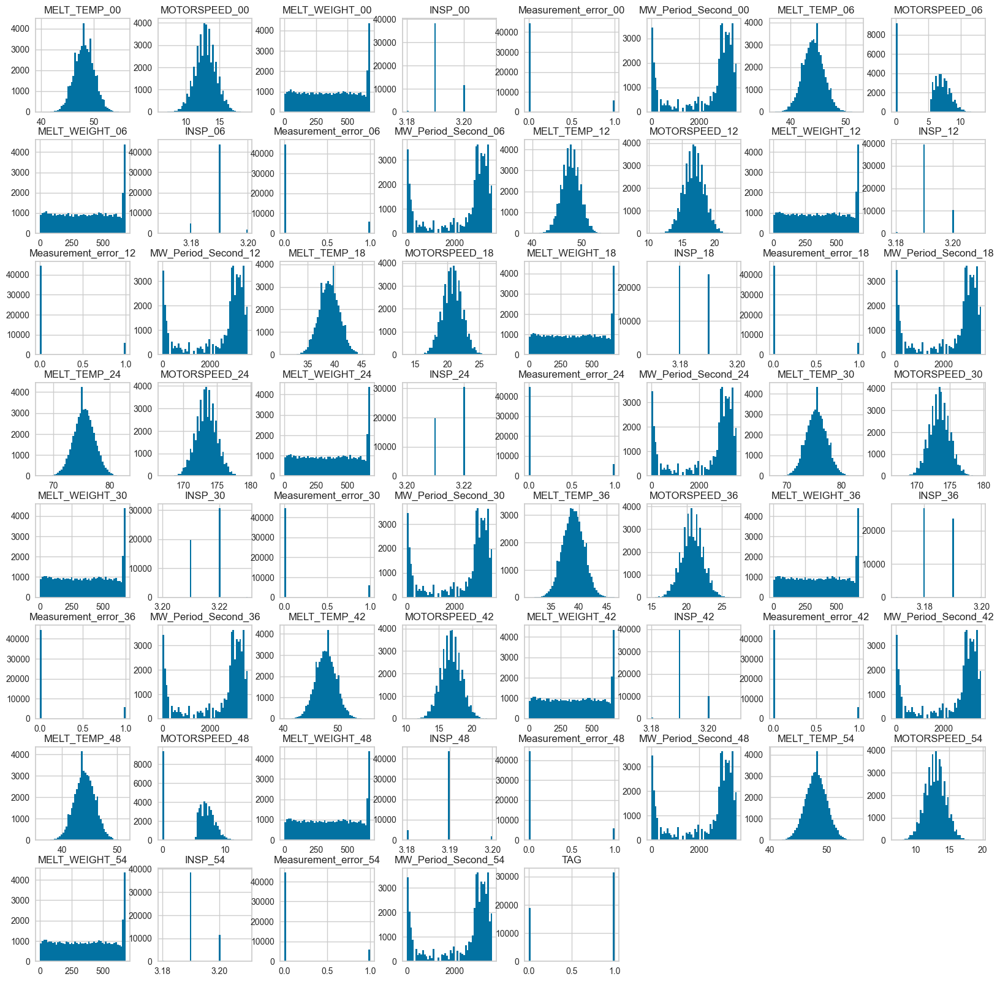

In [5]:
train_data.hist(bins = 50, figsize = (20,20))
plt.show()

In [6]:
train_data['TAG'].value_counts()

1    31466
0    18934
Name: TAG, dtype: int64

In [7]:
train_ok, train_ng = train_data['TAG'].value_counts()
train_on = len(train_data)
train_ok_rate = train_ok/train_on
train_ng_rate = train_ng/train_on
print(f'train ok rate : [{train_ok_rate}]')
print(f'train ng rate : [{train_ng_rate}]')

train ok rate : [0.6243253968253968]
train ng rate : [0.37567460317460316]


In [8]:
test_ok, test_ng = test_data['TAG'].value_counts()
test_on = len(test_data)
test_ok_rate = test_ok/test_on
test_ng_rate = test_ng/test_on
print(f'test ok rate : [{test_ok_rate}]')
print(f'test ng rate : [{test_ng_rate}]')

test ok rate : [0.7178442028985508]
test ng rate : [0.2821557971014493]


# Modeling

## IsolationForest

In [9]:
val_contamination = 0.3

In [10]:
train_x = train_data.drop(columns=['TAG'])

In [11]:
model = IsolationForest(n_estimators=125, max_samples='auto', contamination=val_contamination, 
                        random_state=42, n_jobs=-1,verbose=0,max_features=2)
model.fit(train_x)

IsolationForest(contamination=0.3, max_features=2, n_estimators=125, n_jobs=-1,
                random_state=42)

In [12]:
def get_pred_label(model_pred):
    # IsolationForest 모델 출력 (1:정상, -1:불량(사기)) 이므로 (0:정상, 1:불량(사기))로 Label 변환
    model_pred = np.where(model_pred == 1, 0, model_pred)
    model_pred = np.where(model_pred == -1, 1, model_pred)
    return model_pred

In [13]:
test_x = test_data.drop(columns=['TAG']) # Input Data
test_y = test_data['TAG'] # Label

test_pred = model.predict(test_x) # model prediction
test_pred = get_pred_label(test_pred)
test_f1_score = f1_score(test_y, test_pred)
test_accuracy_score = accuracy_score(test_y, test_pred)
print(f'Validation F1 Score : [{test_f1_score}]')
print(f'Validation Accuracy Score : [{test_accuracy_score}]')
print(classification_report(test_y, test_pred))

Validation F1 Score : [0.19724617656867882]
Validation Accuracy Score : [0.49127415458937196]
              precision    recall  f1-score   support

           0       0.66      0.60      0.63     23775
           1       0.18      0.22      0.20      9345

    accuracy                           0.49     33120
   macro avg       0.42      0.41      0.41     33120
weighted avg       0.52      0.49      0.51     33120



In [14]:
p = precision_score(test_y, test_pred)
print("precision : %0.4f" %p)
r = recall_score(test_y, test_pred)
print("recall : %0.4f" %r)
f1 = f1_score(test_y, test_pred)
print("f1-score : %0.4f" %f1)
acc = accuracy_score(test_y, test_pred)
print("recall : %0.4f" %acc)

precision : 0.1778
recall : 0.2215
f1-score : 0.1972
recall : 0.4913


In [15]:
classify = confusion_matrix(test_y, test_pred)

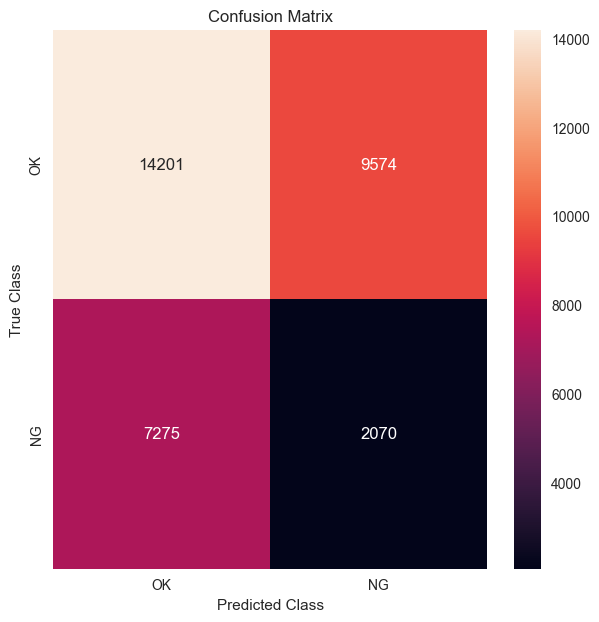

In [16]:
plt.figure(figsize=(7, 7))
sns.heatmap(classify, xticklabels=['OK', 'NG'], yticklabels=['OK', 'NG'], annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class'); plt.ylabel('True Class')
plt.show()

## EllipticEnvelopeLGBM

In [17]:
fraud_ratio = train_data['TAG'].values.sum() / len(test_data)
print(fraud_ratio)

0.9500603864734299


In [18]:
model = EllipticEnvelope(contamination = fraud_ratio, random_state = 42,support_fraction = 0.994,) 
model.fit(train_x)

EllipticEnvelope(contamination=0.9500603864734299, random_state=42,
                 support_fraction=0.994)

In [19]:
def get_pred_label(model, x, k):
    prob = model.score_samples(x)
    prob = torch.tensor(prob, dtype = torch.float)
    topk_indices = torch.topk(prob, k = k, largest = False).indices

    pred = torch.zeros(len(x), dtype = torch.long)
    pred[topk_indices] = 1
    return pred , prob

In [20]:
test_pred  = get_pred_label(model, test_x,9900)

In [21]:
test_f1_score = f1_score(test_y, np.array(test_pred)[0])
test_accuracy_score = accuracy_score(test_y, np.array(test_pred)[0])
print(f'Validation F1 Score : [{test_f1_score}]')
print(f'Validation Accuracy Score : [{test_accuracy_score}]')
print(classification_report(test_y, np.array(test_pred)[0]))

Validation F1 Score : [0.24182904650558587]
Validation Accuracy Score : [0.5594504830917875]
              precision    recall  f1-score   support

           0       0.70      0.68      0.69     23775
           1       0.24      0.25      0.24      9345

    accuracy                           0.56     33120
   macro avg       0.47      0.47      0.47     33120
weighted avg       0.57      0.56      0.56     33120



In [23]:
p = precision_score(test_y, test_pred[0])
print("precision : %0.4f" %p)
r = recall_score(test_y, test_pred[0])
print("recall : %0.4f" %r)
f1 = f1_score(test_y, test_pred[0])
print("f1-score : %0.4f" %f1)
acc = accuracy_score(test_y, test_pred[0])
print("recall : %0.4f" %acc)

precision : 0.2351
recall : 0.2490
f1-score : 0.2418
recall : 0.5595


In [24]:
test_pred

(tensor([0, 0, 0,  ..., 0, 0, 0]),
 tensor([-29.6473, -38.1719, -22.0349,  ..., -38.3014, -32.1201, -34.7819]))

In [25]:
classify = confusion_matrix(test_y, test_pred[0])

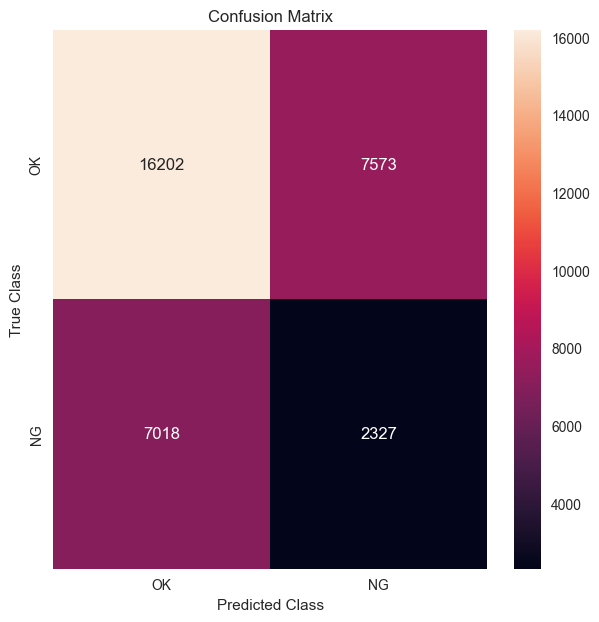

In [26]:
plt.figure(figsize=(7, 7))
sns.heatmap(classify, xticklabels=['OK', 'NG'], yticklabels=['OK', 'NG'], annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class'); plt.ylabel('True Class')
plt.show()

In [27]:
train_pred, _ = get_pred_label(model, train_x, 17640)
Y = np.array(train_pred)

In [28]:

#skf = StratifiedKFold(n_splits = 5 , random_state = 42 , shuffle = True)

score = []
def lgb_optimization(trial):
    score = []
    skf = StratifiedKFold(n_splits = 5 , random_state = 42 , shuffle = True)
    for train_fold, test_fold in tqdm(skf.split(train_x, Y), desc = 'k_fold'):
        X_train, X_test, y_train, y_test = train_x.iloc[train_fold], train_x.iloc[test_fold], Y[train_fold], Y[test_fold] 
        
        params = {            
            "boosting_type" : trial.suggest_categorical('boosting_type',['dart','gbdt']),
            "learning_rate": trial.suggest_uniform('learning_rate', 0.2, 0.99),
            "n_estimators": trial.suggest_int("n_estimators", 100, 300, step=10),
            "max_depth": trial.suggest_int("max_depth", 1, 15),
            "num_leaves": trial.suggest_int("num_leaves", 2, 256),
            "reg_alpha": trial.suggest_float("reg_alpha", 1e-4, 1),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-4, 1),
            "subsample": trial.suggest_float("subsample", 0.4, 1.0),
            "subsample_freq": trial.suggest_int("subsample_freq", 1, 30),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),
            "min_child_samples": trial.suggest_int("min_child_samples", 5, 50),
            "max_bin": trial.suggest_int("max_bin", 50, 100),
            "verbosity": -1,
            "random_state": trial.suggest_int("random_state", 1, 10000),
            'scale_pos_weight': trial.suggest_int("scale_pos_weight", 1, 10)
        }
        model_lgb = LGBMClassifier(**params)
        model_lgb.fit(X_train, y_train)
        lgb_cv_pred = model_lgb.predict(X_test)
        
        score_cv = f1_score(Y[test_fold] , lgb_cv_pred )
        
        score.append(score_cv)
    print(score)
    return np.mean(score) 

In [29]:
# 1-fold , 2-fold ... 20-fold 분할 및 성능 평가와
# Best Hyper-parameter를 순차적으로 고정+탐색 , 고정+고정+탐색.. 하는 방식으로 
# 가장 train label을 안정적으로 찾는 parameter를 획득
# 해당 code엔 편의상 5 fold로 명시

sampler = TPESampler()
optim = optuna.create_study(
    study_name="lgb_parameter_opt",
    direction="maximize",
    sampler=sampler,
)
#optim.optimize(lgb_optimization, n_trials=1)
optim.optimize(lgb_optimization, n_trials=100)
print("Best F1:", optim.best_value)

[I 2022-11-09 01:22:47,800] A new study created in memory with name: lgb_parameter_opt


k_fold: 0it [00:00, ?it/s]

[I 2022-11-09 01:22:50,072] Trial 0 finished with value: 0.8079693081122074 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.8933015172897032, 'n_estimators': 250, 'max_depth': 5, 'num_leaves': 143, 'reg_alpha': 0.12872819709061933, 'reg_lambda': 0.6620823070805885, 'subsample': 0.8171085103074068, 'subsample_freq': 5, 'colsample_bytree': 0.5835934197588113, 'min_child_samples': 5, 'max_bin': 95, 'random_state': 4005, 'scale_pos_weight': 1}. Best is trial 0 with value: 0.8079693081122074.


[0.8107555165862926, 0.8115774240231548, 0.807278020378457, 0.8034588890517367, 0.8067766905213962]


k_fold: 0it [00:00, ?it/s]

[I 2022-11-09 01:22:51,579] Trial 1 finished with value: 0.5399451637604604 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.2919598855560356, 'n_estimators': 150, 'max_depth': 3, 'num_leaves': 153, 'reg_alpha': 0.6919706567633205, 'reg_lambda': 0.6712405657870569, 'subsample': 0.6699797699339769, 'subsample_freq': 26, 'colsample_bytree': 0.3845850669312886, 'min_child_samples': 38, 'max_bin': 54, 'random_state': 7568, 'scale_pos_weight': 6}. Best is trial 0 with value: 0.8079693081122074.


[0.5402625316650034, 0.5416024653312789, 0.5461466749533872, 0.5343778521448128, 0.5373362947078195]


k_fold: 0it [00:00, ?it/s]

KeyboardInterrupt: 

In [30]:
params = {'boosting_type': 'gbdt', 'learning_rate': 0.9891999451309849, 'n_estimators': 300, 'max_depth': 2, 'num_leaves': 10, 
          'reg_alpha': 0.7029161924984682, 'reg_lambda': 0.0954175033141712, 'subsample': 0.9876162891818908, 'subsample_freq': 24,
          'colsample_bytree': 0.7360641888195573, 'min_child_samples': 14, 'max_bin': 90, 'random_state': 3163, 'scale_pos_weight': 2}

In [31]:
model2 = LGBMClassifier(**params )
model2.fit(train_x, Y)

LGBMClassifier(colsample_bytree=0.7360641888195573,
               learning_rate=0.9891999451309849, max_bin=90, max_depth=2,
               min_child_samples=14, n_estimators=300, num_leaves=10,
               random_state=3163, reg_alpha=0.7029161924984682,
               reg_lambda=0.0954175033141712, scale_pos_weight=2,
               subsample=0.9876162891818908, subsample_freq=24)

In [32]:
lgb_public_pred = model2.predict(test_x)

In [33]:
test_f1_score = f1_score(test_y, lgb_public_pred)
test_accuracy_score = accuracy_score(test_y, lgb_public_pred)
print(f'Validation F1 Score : [{test_f1_score}]')
print(f'Validation Accuracy Score : [{test_accuracy_score}]')
print(classification_report(test_y, lgb_public_pred))

Validation F1 Score : [0.29817755322988093]
Validation Accuracy Score : [0.5302536231884057]
              precision    recall  f1-score   support

           0       0.70      0.60      0.65     23775
           1       0.26      0.35      0.30      9345

    accuracy                           0.53     33120
   macro avg       0.48      0.48      0.47     33120
weighted avg       0.58      0.53      0.55     33120



In [34]:
p = precision_score(test_y, lgb_public_pred)
print("precision : %0.4f" %p)
r = recall_score(test_y, lgb_public_pred)
print("recall : %0.4f" %r)
f1 = f1_score(test_y, lgb_public_pred)
print("f1-score : %0.4f" %f1)
acc = accuracy_score(test_y, lgb_public_pred)
print("recall : %0.4f" %acc)

precision : 0.2577
recall : 0.3537
f1-score : 0.2982
recall : 0.5303


In [35]:
classify = confusion_matrix(test_y, lgb_public_pred)

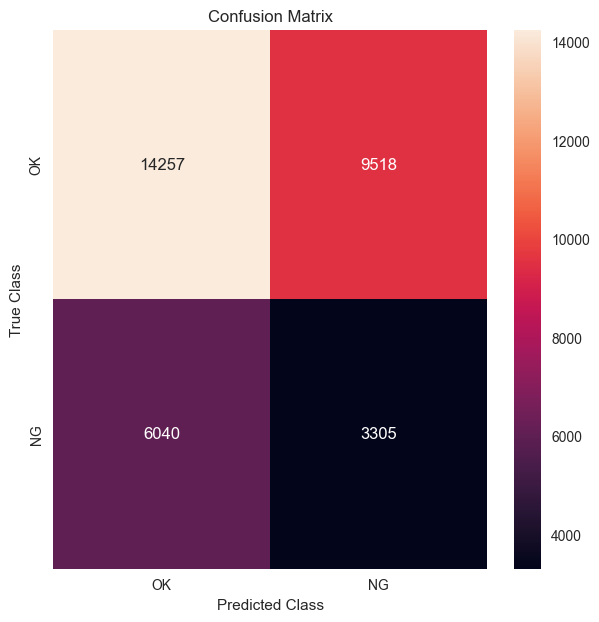

In [36]:
plt.figure(figsize=(7, 7))
sns.heatmap(classify, xticklabels=['OK', 'NG'], yticklabels=['OK', 'NG'], annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class'); plt.ylabel('True Class')
plt.show()

In [37]:
pp =  np.array(test_pred)[0]|lgb_public_pred

In [38]:
test_f1_score = f1_score(test_y, pp)
test_accuracy_score = accuracy_score(test_y, pp)
print(f'Validation F1 Score : [{test_f1_score}]')
print(f'Validation Accuracy Score : [{test_accuracy_score}]')
print(classification_report(test_y, pp))

Validation F1 Score : [0.2964467882769949]
Validation Accuracy Score : [0.5085748792270531]
              precision    recall  f1-score   support

           0       0.69      0.56      0.62     23775
           1       0.25      0.37      0.30      9345

    accuracy                           0.51     33120
   macro avg       0.47      0.47      0.46     33120
weighted avg       0.57      0.51      0.53     33120



In [39]:
p = precision_score(test_y, pp)
print("precision : %0.4f" %p)
r = recall_score(test_y, pp)
print("recall : %0.4f" %r)
f1 = f1_score(test_y, pp)
print("f1-score : %0.4f" %f1)
acc = accuracy_score(test_y, pp)
print("recall : %0.4f" %acc)

precision : 0.2487
recall : 0.3669
f1-score : 0.2964
recall : 0.5086


In [40]:
classify = confusion_matrix(test_y, pp)

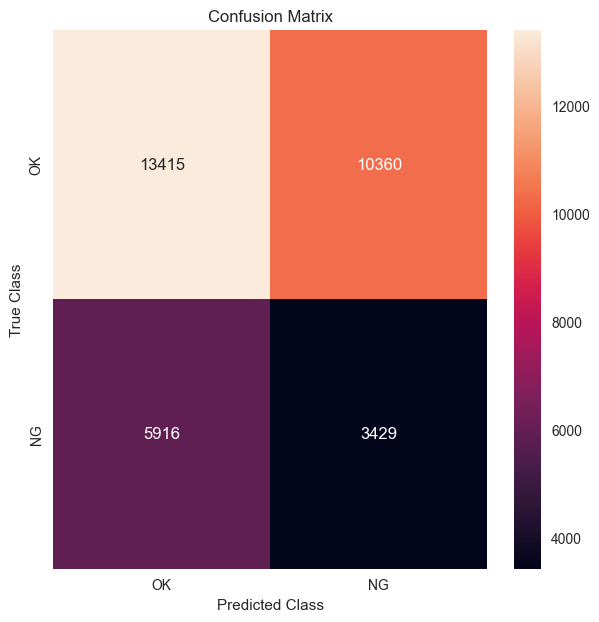

In [41]:
plt.figure(figsize=(7, 7))
sns.heatmap(classify, xticklabels=['OK', 'NG'], yticklabels=['OK', 'NG'], annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class'); plt.ylabel('True Class')
plt.show()

## Pycaret

In [42]:
anomaly = setup(train_x,
                use_gpu = True,
                session_id = 42,
                normalize = True,
                silent=True
               )

,Description,Value
0,session_id,42
1,Original Data,"(50400, 60)"
2,Missing Values,False
3,Numeric Features,50
4,Categorical Features,10
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(50400, 70)"
9,CPU Jobs,-1


### iforest

In [43]:
iforest = create_model('iforest')

In [44]:
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=42, verbose=0)


In [45]:
iforest_results = assign_model(iforest)
iforest_results.head()

,MELT_TEMP_00,MOTORSPEED_00,MELT_WEIGHT_00,INSP_00,Measurement_error_00,MW_Period_Second_00,MELT_TEMP_06,MOTORSPEED_06,MELT_WEIGHT_06,INSP_06,...,Measurement_error_48,MW_Period_Second_48,MELT_TEMP_54,MOTORSPEED_54,MELT_WEIGHT_54,INSP_54,Measurement_error_54,MW_Period_Second_54,Anomaly,Anomaly_Score
STD_DT,,,,,,,,,,,,,,,,,,,,,
2020-03-04 00:00:00,48.9,11.6,631.0,3.19,0.0,912.0,43.3,7.8,609.0,3.19,...,0.0,912.0,48.9,14.8,598.0,3.20,0.0,912.0,0,-0.101847
2020-03-04 00:01:00,50.7,12.8,596.0,3.19,0.0,912.0,40.8,6.6,595.0,3.19,...,0.0,912.0,50.4,13.3,582.0,3.19,0.0,912.0,0,-0.119848
2020-03-04 00:02:00,47.4,13.5,581.0,3.19,0.0,912.0,44.6,6.7,580.0,3.19,...,0.0,912.0,45.6,11.1,568.0,3.19,0.0,912.0,0,-0.122853
2020-03-04 00:03:00,43.7,12.9,567.0,3.19,0.0,912.0,43.5,0.0,565.0,3.19,...,0.0,912.0,46.1,9.4,554.0,3.19,0.0,912.0,0,-0.101657
2020-03-04 00:04:00,45.0,14.5,552.0,3.19,0.0,912.0,43.5,7.2,550.0,3.19,...,0.0,912.0,50.1,10.0,538.0,3.19,0.0,912.0,0,-0.113622


In [47]:
plot_model(iforest, plot = 'tsne')

In [48]:
plot_model(iforest, plot = 'umap')

In [49]:
iforest_test_predictions = predict_model(model = iforest, data = test_x)

In [51]:
test_f1_score = f1_score(test_y, iforest_test_predictions['Anomaly'])
test_accuracy_score = accuracy_score(test_y, iforest_test_predictions['Anomaly'])
print(f'Validation F1 Score : [{test_f1_score}]')
print(f'Validation Accuracy Score : [{test_accuracy_score}]')
print(classification_report(test_y, iforest_test_predictions['Anomaly']))

Validation F1 Score : [0.07398295404621738]
Validation Accuracy Score : [0.6817934782608696]
              precision    recall  f1-score   support

           0       0.71      0.93      0.81     23775
           1       0.21      0.05      0.07      9345

    accuracy                           0.68     33120
   macro avg       0.46      0.49      0.44     33120
weighted avg       0.57      0.68      0.60     33120

